<a href="https://colab.research.google.com/github/raisakbar27/Museum-Hewan/blob/main/helm_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt
%pip install -qr roboflow

import torch
import os
from IPython.display import Image, clear_output

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16413, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 16413 (delta 0), reused 3 (delta 0), pack-reused 16408
Receiving objects: 100% (16413/16413), 14.90 MiB | 22.43 MiB/s, done.
Resolving deltas: 100% (11265/11265), done.
/content/yolov5/yolov5
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'roboflow'
Setup complete. Using torch 2.1.0+cu121 (CPU)


In [3]:
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [4]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="q8hJOTNoojlLLvn8IrB6")
project = rf.workspace("raisaw").project("helm-model-8rixw")
dataset = project.version(1).download("yolov5")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.5 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/helm-model-1 in yolov5pytorch:: 100%|██████████| 412/412 [00:00<00:00, 3954.60it/s]


In [5]:
!python train.py --img 416 --batch 16 --epochs 20 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

2024-02-12 06:57:40.659174: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-12 06:57:40.659239: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-12 06:57:40.661481: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/datasets/helm-model-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=20, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=

In [6]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [7]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/helm-model-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.12 torch-2.1.0+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/20 /content/datasets/helm-model-1/test/images/Image-114-_jpg.rf.7f193b776c2108a1da0766c78130038d.jpg: 416x416 1 helm, 205.7ms
image 2/20 /content/datasets/helm-model-1/test/images/Image-118-_jpg.rf.8bb6a5355e5a1ccfc515a297203c092c.jpg: 416x416 4 helms, 189.0ms
image 3/20 /content/datasets/helm-model-1/test/images/Image-12

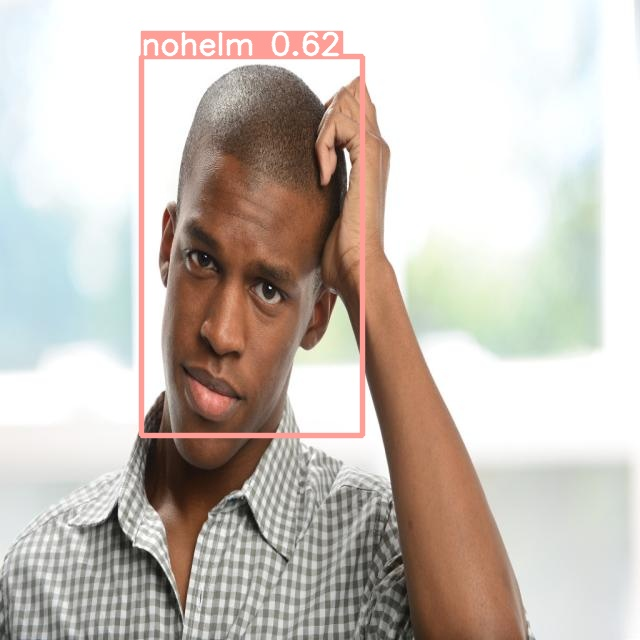

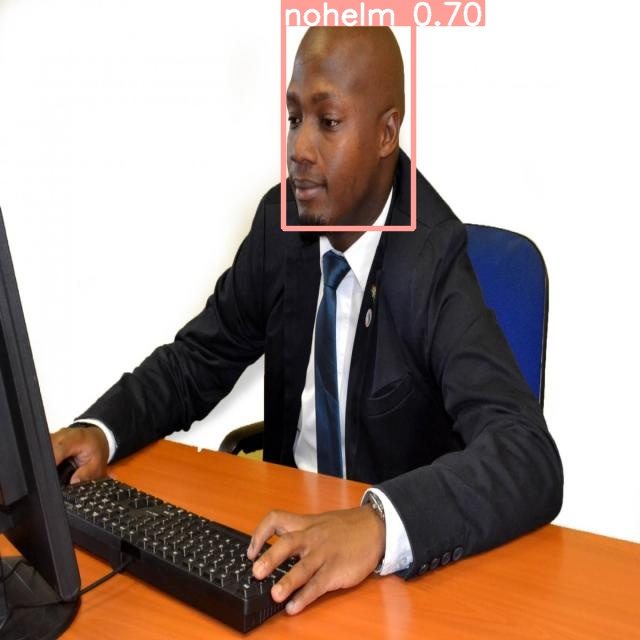

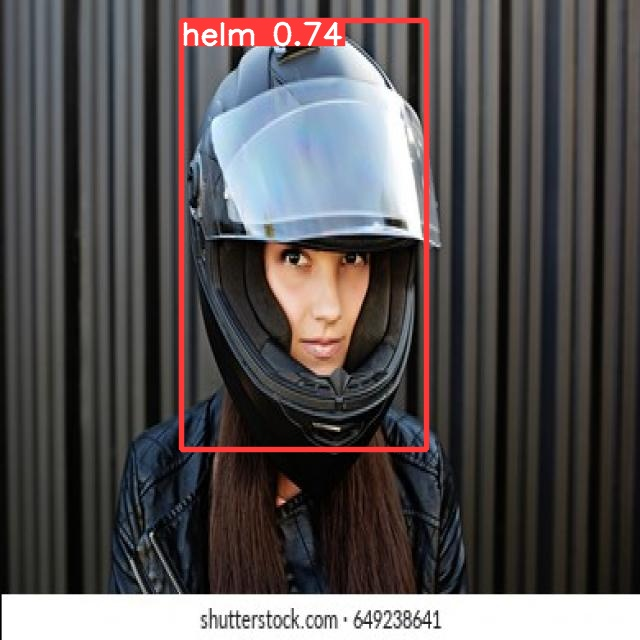

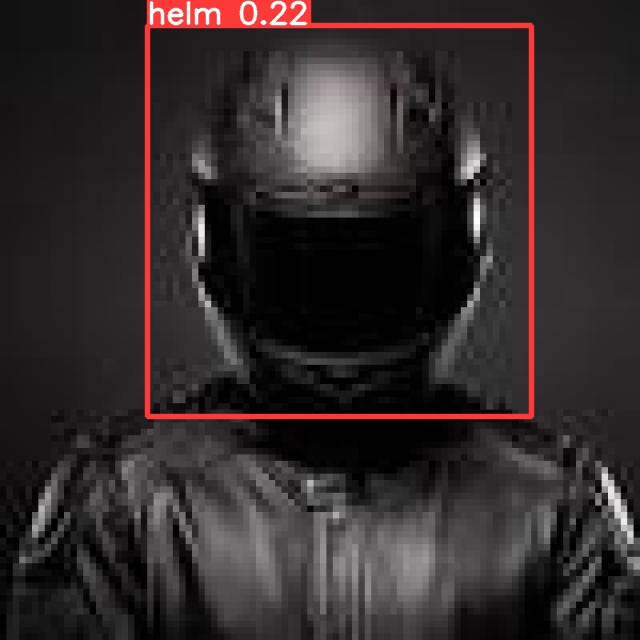

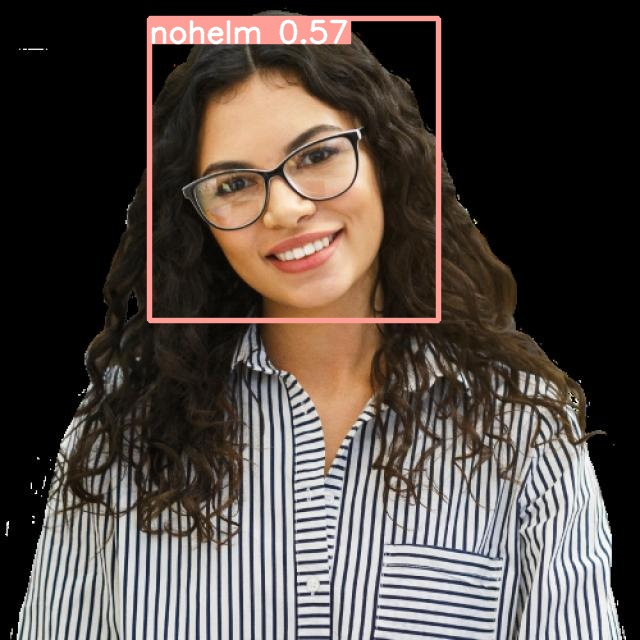

...

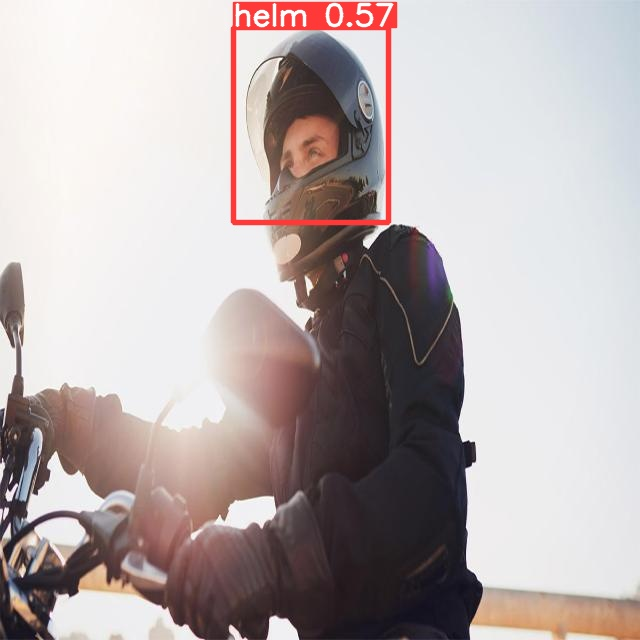

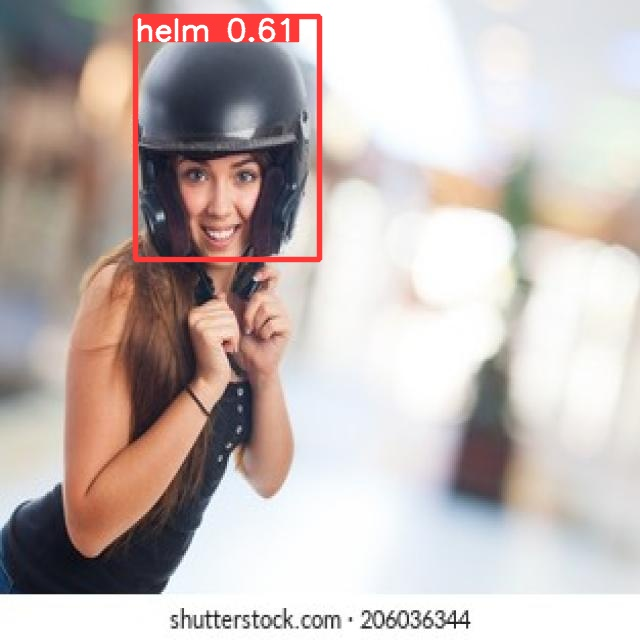

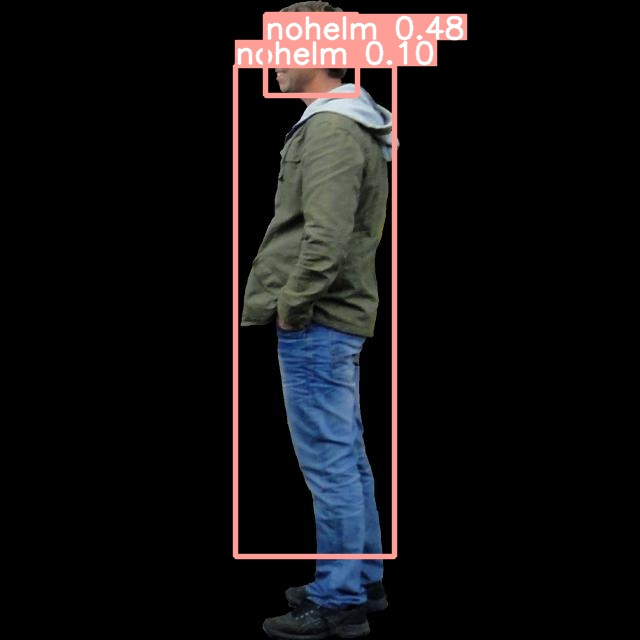

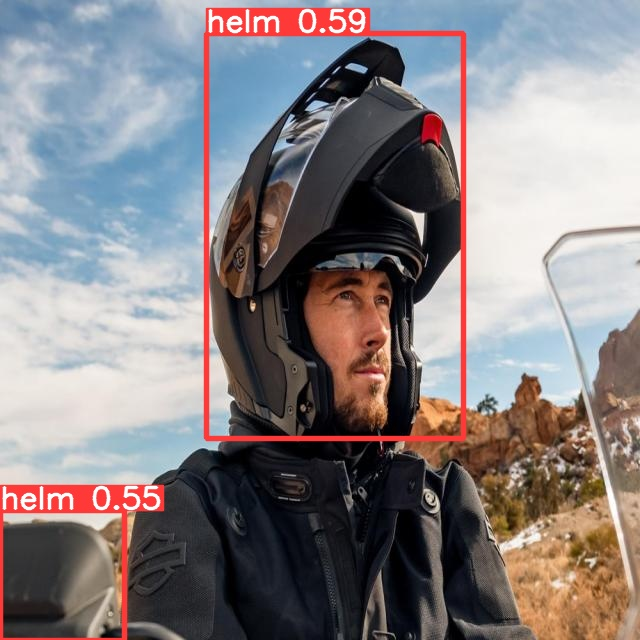

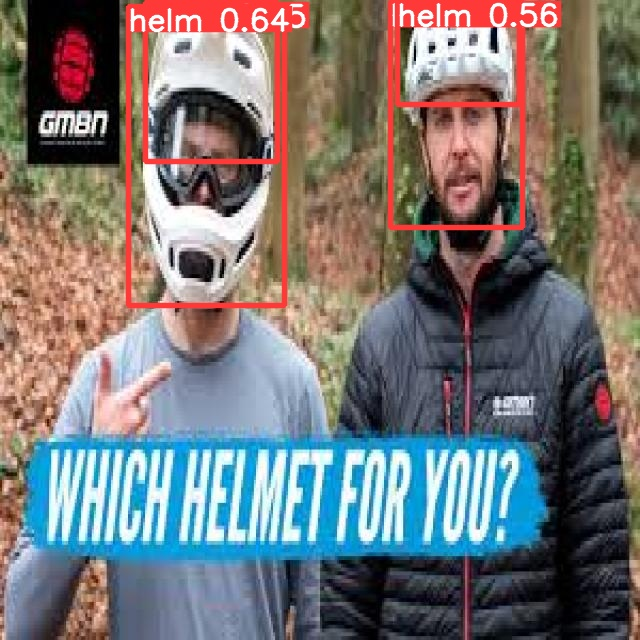

In [10]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/yolov5/runs/detect/exp/*.jpg'):
  display(Image(filename=imageName))
  print("\n")

In [11]:
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

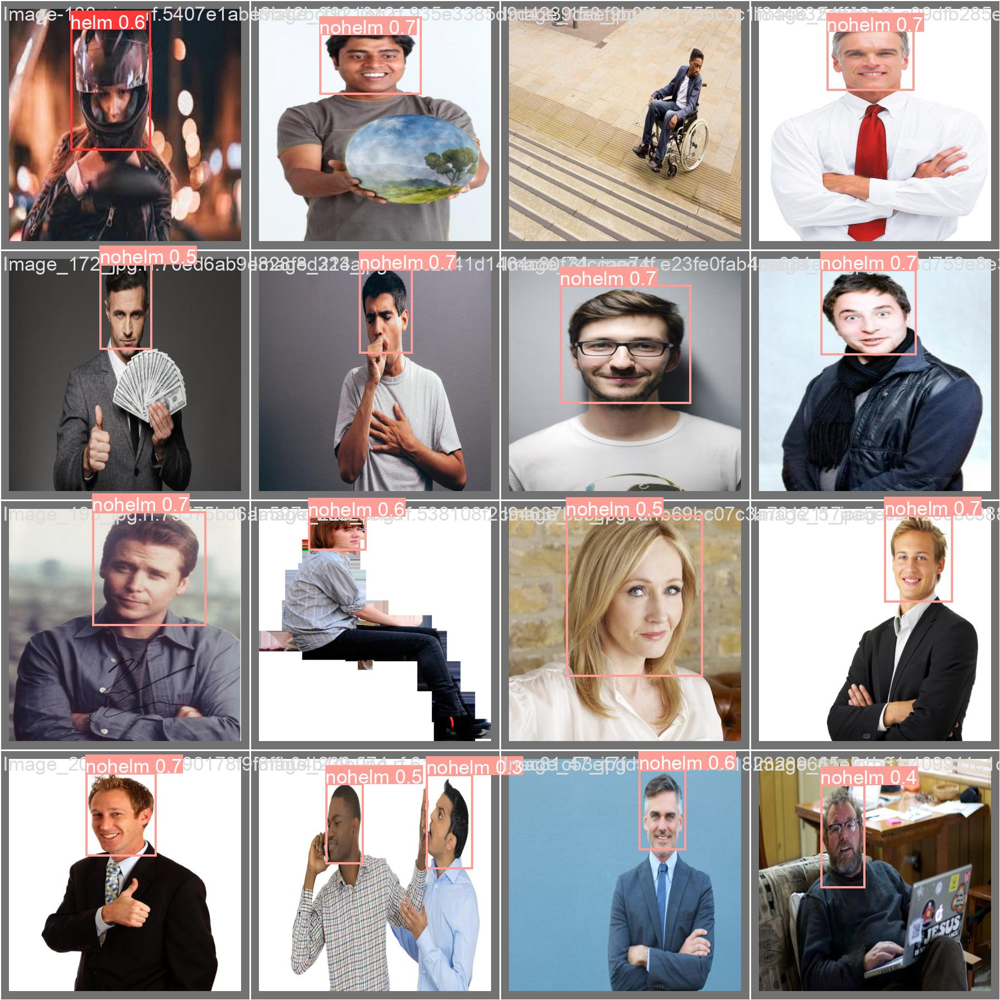

In [13]:
Image(filename= '/content/yolov5/yolov5/runs/train/exp/val_batch0_pred.jpg', width=1400)

In [14]:
import torch
from PIL import Image
from torchvision.transforms import functional as F

In [15]:
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/yolov5/yolov5/runs/train/exp/weights/last.pt')

You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2024-2-12 Python-3.10.12 torch-2.1.0+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


In [20]:
img_path = '/content/datasets/helm-model-1/train/images/Image-109-_jpg.rf.d43605ed6c5e3bc5e14e09dbf18f6f31.jpg'
img = Image.open(img_path)

In [21]:
results = model(img)

In [22]:
results.print()

image 1/1: 640x640 2 helms
Speed: 10.2ms pre-process, 407.1ms inference, 2.9ms NMS per image at shape (1, 3, 640, 640)


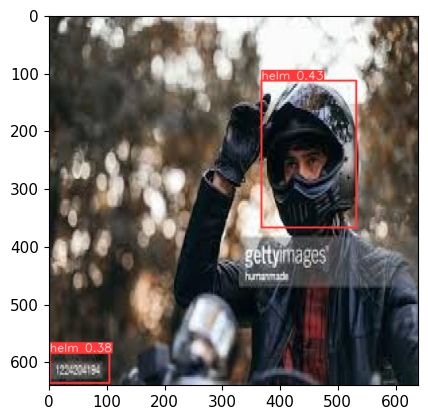

In [26]:
from matplotlib import pyplot as plt
import numpy as np

%matplotlib inline
plt.imshow(np.squeeze(results.render()))
plt.show()

image 1/1: 1600x1200 1 helm
Speed: 70.4ms pre-process, 864.5ms inference, 1.4ms NMS per image at shape (1, 3, 640, 480)


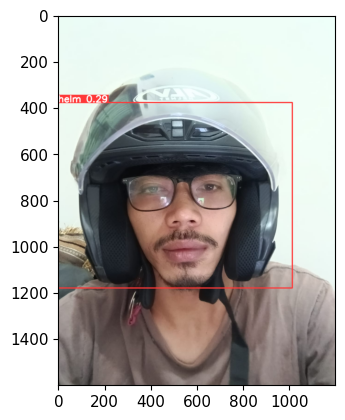

In [10]:
img_path = '/content/datasets/helmtest/helmtest.jpeg'
img = Image.open(img_path)
results = model(img)
results.print()

%matplotlib inline
plt.imshow(np.squeeze(results.render()))
plt.show()

image 1/1: 1600x1200 1 nohelm
Speed: 25.8ms pre-process, 485.8ms inference, 1.8ms NMS per image at shape (1, 3, 640, 480)


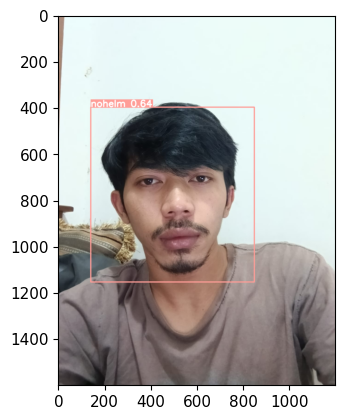

In [11]:
img_path = '/content/datasets/helmtest/nohelmtest.jpeg'
img = Image.open(img_path)
results = model(img)
results.print()

%matplotlib inline
plt.imshow(np.squeeze(results.render()))
plt.show()
